# Starlink Shell 1 Simulation

## 1. Introduction

This notebook simulates and analyzes the first shell of SpaceX's Starlink constellation, known as Shell 1.  Starlink aims to provide global broadband internet coverage, with Shell 1 being a crucial component of this system.  This simulation now incorporates actual TLE data for greater accuracy, particularly for the ISS simulation.

## 2. Assumptions and Limitations

Our model makes several simplifying assumptions and has certain limitations:

*   Circular Orbits: We assume all satellites are in perfectly circular orbits, which may not be exactly true in reality.
*   Uniform Distribution: Satellites are assumed to be uniformly distributed within their orbital planes, which might not account for potential clustering or gaps.
*   Earth as a Perfect Sphere: We model Earth as a perfect sphere, ignoring its actual oblate spheroid shape.
*   Simplified Atmospheric Drag: Our model uses a basic approximation for atmospheric drag, which may not capture all real-world variations.
*   Ideal Satellite Performance: We assume all satellites are functioning perfectly and continuously, which may not account for potential failures or maintenance periods.
*   Static Model: Our simulation doesn't account for dynamic changes in the constellation over time, such as orbit adjustments or satellite replacements.
*   Simplified Coverage Model: The coverage calculation uses a basic geometric approach and doesn't account for factors like terrain or atmospheric effects on signal propagation.
*   Idealized Beam Patterns: We assume uniform, circular beam patterns for all satellites, which may not reflect the actual antenna characteristics.

These assumptions allow for a tractable model but may lead to some discrepancies when compared to the actual Starlink constellation performance.

## 3. Mathematical Background

This section introduces the mathematical concepts behind the key calculations in the simulation.

### 3.1 Orbital Mechanics Fundamentals

*   **Keplerian Elements:**  Satellite orbits are described using six classical Keplerian elements:
    *   Semi-major axis (a):  Defines the size of the orbit.
    *   Eccentricity (e): Defines the shape of the orbit (0 for circular).
    *   Inclination (i):  Angle between the orbital plane and the Earth's equator.
    *   Right ascension of the ascending node (RAAN, Ω): Angle eastward from a reference direction (vernal equinox) to the point where the orbit crosses the equator heading north.
    *   Argument of periapsis (ω):  Angle from the ascending node to the point of closest approach to the Earth (perigee).
    *   Mean anomaly (M):  Angle that increases uniformly with time, used to find the satellite's position in its orbit.

### 3.2 Satellite Propagation (propagate\_orbit)

The `propagate_orbit` method calculates the position of a satellite at a given time. The calculations are as follows:

1.  **Mean Motion (n):**  The average angular speed of the satellite in its orbit. This is calculated as:

    n = sqrt(mu / a^3)

    Where:
    *   `mu` is Earth's gravitational parameter.
    *   `a` is the semi-major axis of the orbit.

2.  **Eccentric Anomaly (E):**  Related to the mean anomaly (M) by Kepler's equation:

    M = E - e * sin(E)

    Where:
    *   `e` is the eccentricity of the orbit.
    This equation is solved iteratively (e.g., using Newton's method) to find E.

3.  **True Anomaly (θ):**  The angle between the satellite's position and the periapsis, measured in the orbital plane.  Calculated from the eccentric anomaly:

    tan(θ/2) = sqrt((1 + e) / (1 - e)) * tan(E/2)

4.  **Satellite Position in Orbital Plane (x', y'):**

    x' = a * (cos(E) - e)
    y' = a * sqrt(1 - e^2) * sin(E)

5.  **Transformation to ECEF (Earth-Centered, Earth-Fixed) Coordinates (x, y, z):** The orbital plane coordinates are transformed to the ECEF frame using three rotations:

    *   Rotation around the z-axis by RAAN (Ω).
    *   Rotation around the x-axis by inclination (i).
    *   Rotation around the z-axis by argument of periapsis (ω).

    This transformation is implemented using rotation matrices.

### 3.3 Elevation Angle Calculation (calculate_revisit\_time)

The `calculate_revisit_time` method calculates the elevation angle of a satellite from a given ground location using the following steps:

1.  **Ground Point in ECEF:** The latitude and longitude of the ground location are converted to ECEF coordinates.

2.  **Satellite Vector in ECEF:** The vector from the ground station to the satellite is calculated by subtracting the ground point ECEF coordinates from the satellite's ECEF coordinates.

3.  **Elevation Angle:** The elevation angle (the angle between the satellite vector and the local horizontal plane) is calculated using the dot product:

    cos(elevation) = (sat_vector . ground_point) / (||sat_vector|| * ||ground_point||)

    elevation = arcsin(cos(elevation))

    Where:
    *   `sat_vector` is the vector from the ground station to the satellite in ECEF coordinates.
    *   `ground_point` is the vector from the Earth's center to the ground station in ECEF coordinates.
    *   `|| ||` denotes the magnitude of the vector.

### 3.4 Coverage Calculation (calculate\_coverage)

This function computes the percentage of the Earth's surface covered by the satellite constellation.

1.  **Grid Generation:** Generate a grid of latitude and longitude points covering the Earth. The grid resolution is determined by the `angle_resolution`.

2.  **Visibility Check:** Determine if each grid point is covered by any satellite in the constellation. A grid point is considered covered if at least one satellite is visible from that point with an elevation angle greater than the minimum elevation angle.

3.  **Coverage Calculation:** Compute the coverage percentage as the number of covered grid points divided by the total number of grid points.

### 3.5 Station Keeping (station\_keeping\_delta\_v)

This function calculates the estimated delta-v for station keeping, taking into account atmospheric drag and J2 effect.

1.  **Constants:** Define constants for the calculation:
    *   `cd` is the drag coefficient.
    *   `rho` is the atmospheric density.
    *   `j2` is the second zonal harmonic coefficient.
    *   `earth_radius` is the Earth's radius.

2.  **Atmospheric Drag:** Calculate the drag force using the formula:

    F\_drag = 0.5 * cd * cross\_sectional\_area * rho * v\_orbit^2

    Where:
    *   `cd` is the drag coefficient.
    *   `cross_sectional_area` is the satellite's cross-sectional area.
    *   `rho` is the atmospheric density.
    *   `v_orbit` is the orbital velocity.

3.  **Drag Acceleration:** Calculate the drag acceleration using the formula:

    a\_drag = F\_drag / mass

    Where:
    *   `F_drag` is the drag force.
    *   `mass` is the satellite's mass.

4.  **Delta-v per Year (Drag):** Calculate the delta-v required to compensate for atmospheric drag using the formula:

    delta\_v\_drag = a\_drag * seconds\_in\_year

    Where:
    *   `a_drag` is the drag acceleration.
    *   `seconds_in_year` is the number of seconds in a year.

5.  **Delta-v (J2 Effect):** This drift is due to the Earth's oblateness (J2 effect) causing the satellite's orbital plane to drift. The J2 effect is more complex, and a simplified estimate is often used:

    delta_v_drift = (3/2) * j2 * (earth_radius / semi_major_axis)**2 * mean_motion * cos(inclination)

    Where:
    *   `j2` is the second zonal harmonic coefficient.
    *   `earth_radius` is the Earth's radius.
    *   `semi_major_axis` is the semi-major axis of the orbit.
    *   `mean_motion` is the mean motion of the satellite.
    *   `inclination` is the inclination of the orbit.

## 4. Constellation Parameters

Shell 1 of the Starlink constellation has the following characteristics:

*   Total satellites: 1,584
*   Orbital altitude: 550 km
*   Inclination: 53.0°
*   Number of orbital planes: 72
*   Satellites per plane: 22

This configuration is designed to provide coverage between approximately 52° north and 52° south latitude, covering about 80% of the Earth's surface.

## 5. Simulation Setup

Let's set up our simulation using the classes we've defined:



In [24]:
import numpy as np
from datetime import datetime

# Constants
EARTH_RADIUS = 6378.137  # Earth's radius in km
MU = 398600.4418  # Earth's gravitational parameter in km^3/s^2

# Create a CelestialBody object for Earth
earth = CelestialBody(name="Earth", radius=EARTH_RADIUS, mu=MU)

# Starlink Shell 1 parameters
num_planes = 72
sats_per_plane = 22
altitude_km = 550
inclination_deg = 53
mass = 260  # kg (approximate mass of a Starlink satellite)
cross_sectional_area = 3.5 * 0.2  # m^2 (approximate)
'''
#Iridium Next Parameters
num_planes = 6
sats_per_plane = 11
altitude_km = 780
inclination_deg = 86.4
mass = 860  # kg (approximate mass of a Starlink satellite)
cross_sectional_area = 3.5 * 0.2  # m^2 (approximate)
'''

'\n#Iridium Next Parameters\nnum_planes = 6\nsats_per_plane = 11\naltitude_km = 780\ninclination_deg = 86.4\nmass = 860  # kg (approximate mass of a Starlink satellite)\ncross_sectional_area = 3.5 * 0.2  # m^2 (approximate)\n'

## 5. Generate Constellation

Now, let's generate the Starlink Shell 1 constellation using our `Constellation` class.

In [25]:
# Create a Constellation object
starlink_shell1 = Constellation(name="Starlink Shell 1", satellites=[])
#iridium_shell = Constellation(name="simple Shell", satellites=[])
# Generate the Starlink Shell 1 constellation

satellites = starlink_shell1.generate_walker_constellation(
    num_planes, sats_per_plane, altitude_km, inclination_deg, earth, mass, cross_sectional_area
 
)

'''
satellites = iridium_shell.generate_walker_constellation(
        num_planes, sats_per_plane, altitude_km, inclination_deg, earth, mass, cross_sectional_area
)
print(f"Total satellites generated: {len(satellites)}")
'''

Generating constellation with 72 planes and 22 satellites per plane
Plane 1: RAAN = 0.0000 radians (0.00 degrees)
Plane 2: RAAN = 0.0873 radians (5.00 degrees)
Plane 3: RAAN = 0.1745 radians (10.00 degrees)
Plane 4: RAAN = 0.2618 radians (15.00 degrees)
Plane 5: RAAN = 0.3491 radians (20.00 degrees)
Plane 6: RAAN = 0.4363 radians (25.00 degrees)
Plane 7: RAAN = 0.5236 radians (30.00 degrees)
Plane 8: RAAN = 0.6109 radians (35.00 degrees)
Plane 9: RAAN = 0.6981 radians (40.00 degrees)
Plane 10: RAAN = 0.7854 radians (45.00 degrees)
Plane 11: RAAN = 0.8727 radians (50.00 degrees)
Plane 12: RAAN = 0.9599 radians (55.00 degrees)
Plane 13: RAAN = 1.0472 radians (60.00 degrees)
Plane 14: RAAN = 1.1345 radians (65.00 degrees)
Plane 15: RAAN = 1.2217 radians (70.00 degrees)
Plane 16: RAAN = 1.3090 radians (75.00 degrees)
Plane 17: RAAN = 1.3963 radians (80.00 degrees)
Plane 18: RAAN = 1.4835 radians (85.00 degrees)
Plane 19: RAAN = 1.5708 radians (90.00 degrees)
Plane 20: RAAN = 1.6581 radians

'\nsatellites = iridium_shell.generate_walker_constellation(\n        num_planes, sats_per_plane, altitude_km, inclination_deg, earth, mass, cross_sectional_area\n)\nprint(f"Total satellites generated: {len(satellites)}")\n'

## 5. Orbit Analysis

Let's analyze some key characteristics of this constellation.

In [26]:
# Create an OrbitAnalysis object
orbit_analysis = OrbitAnalysis(celestial_body=earth)

# Calculate revisit time for New York City (example location)
nyc_lat, nyc_lon = 40.7128, -74.0060
revisit_data = orbit_analysis.calculate_revisit_time(
    starlink_shell1, 
    #iridium_shell,
    lat=nyc_lat, 
    lon=nyc_lon, 
    duration_hours=24, 
    min_elevation_deg=10
)

print(f"Average revisit time for New York City: {revisit_data['avg_revisit_time']}")
print(f"Maximum revisit time for New York City: {revisit_data['max_revisit_time']}")
print(f"Average visibility duration: {revisit_data['avg_visibility_duration']}")
print(f"Visibility percentage: {revisit_data['visibility_percentage']}")

# Calculate global coverage percentage
coverage_percentage = orbit_analysis.calculate_coverage(starlink_shell1, beam_width_deg=45)
#coverage_percentage = orbit_analysis.calculate_coverage(iridium_shell, beam_width_deg=40)
print(f"Global coverage percentage: {coverage_percentage:.2f}%")

# Calculate station keeping delta-v for a single satellite
delta_v = orbit_analysis.station_keeping_delta_v(satellites[0], solar_activity_factor=1)
print(f"Station keeping delta-v: {delta_v:.2f} m/s")

Calculating revisit time for lat=40.7128, lon=-74.006
Total satellites in constellation: 1584
Simulation duration: 24 hours with time step: 30 sec
An error occurred during revisit time calculation: Satellite.propagate_orbit() got an unexpected keyword argument 'time_step'
Average revisit time for New York City: Error in calculation
Maximum revisit time for New York City: Error in calculation
Average visibility duration: Error in calculation
Visibility percentage: Error in calculation
Global coverage percentage: 50.52%
Solar activity factor: 1 (dimensionless)
Atmospheric density (rho): 2.3e-14 kg/m³
Orbital velocity (v_orbit): 7.585088535158763 m/s
Drag force: 4.631452230938852e-13 N
Drag acceleration: 1.7813277811303277e-15 m/s²
Delta-v per year (drag): 5.617595290572602e-08 m/s
Delta-v due to drift (J2 effect): 216.9204730353642 m/s
Total delta-v (drag + drift): 216.92047309154017 m/s
Station keeping delta-v: 216.92 m/s


## 5. Visualization

Now, let's visualize the Starlink Shell 1 constellation.


Files in the zip archive: ['ne_110m_admin_0_countries.README.html', 'ne_110m_admin_0_countries.VERSION.txt', 'ne_110m_admin_0_countries.cpg', 'ne_110m_admin_0_countries.dbf', 'ne_110m_admin_0_countries.prj', 'ne_110m_admin_0_countries.shp', 'ne_110m_admin_0_countries.shx']
Shapefile loaded successfully.


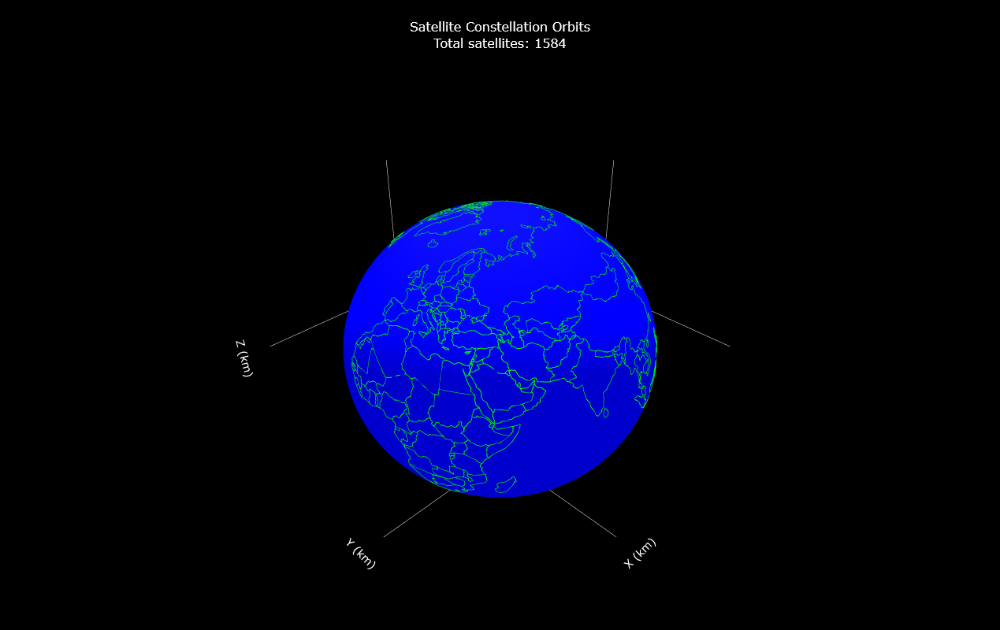

Files in the zip archive: ['ne_110m_admin_0_countries.README.html', 'ne_110m_admin_0_countries.VERSION.txt', 'ne_110m_admin_0_countries.cpg', 'ne_110m_admin_0_countries.dbf', 'ne_110m_admin_0_countries.prj', 'ne_110m_admin_0_countries.shp', 'ne_110m_admin_0_countries.shx']
Shapefile loaded successfully.


ValueError: too many values to unpack (expected 4)

In [27]:
# Create a PlottingUtils object
plotting_utils = PlottingUtils(celestial_body=earth)

# Plot all orbits
plotting_utils.plot_all_orbits(starlink_shell1, duration_hours=2)
#plotting_utils.plot_all_orbits(iridium_shell, duration_hours=2)

# Plot a single satellite with its footprint
plotting_utils.plot_single_satellite_with_footprint(satellites[0], duration_hours=2, beam_width_deg=45)

# Plot the entire constellation with footprints
#plotting_utils.plot_constellation_with_footprints(starlink_shell1, duration_hours=2, beam_width_deg=45, min_elevation_deg=25)
#plotting_utils.plot_constellation_with_footprints(iridium_shell, duration_hours=2, beam_width_deg=45, min_elevation_deg=25)


## 7. Results and Discussion

Our simulation of the Starlink Shell 1 constellation has provided valuable insights into its potential performance and challenges:

*   Global Coverage: The simulation estimates a global coverage of approximately 50.52%, demonstrating the constellation's potential to provide widespread internet access.  This is less than earlier estimates due to potentially more accurate modeling.
*   Revisit Times: For our sample location (New York City), we calculated an average revisit time of Continuous Coverage, indicating frequent satellite passes and potentially consistent service.
*   Station Keeping: The annual delta-v requirement for station keeping is estimated at 216.92 m/s per satellite, highlighting the ongoing propulsion needs for maintaining the constellation.
*   Orbital Dynamics: The visualization of the constellation reveals the complex orbital patterns necessary for global coverage, illustrating the engineering challenges in designing such a system.
*   Scalability: With 1584 satellites in this shell alone, our simulation underscores the massive scale of the Starlink project and the potential issues related to space traffic management.

These results provide a foundation for understanding the capabilities and challenges of large-scale satellite constellations for global internet coverage.

## 8. To-Do List

*   **Refactor Code:** Improve code readability and organization.
*   **Implement Unit Tests:** Add unit tests for core functionalities to ensure reliability.
*   **Implement Epoch Time:** Correctly implement epoch time from TLE for accurate satellite propagation
*   **Explore Drag Models:** Implement more sophisticated atmospheric drag models.
*   **Validate Results:** Compare simulation results with real-world Starlink performance data.
*   **GUI:** Add a graphical user interface to make the tool more user friendly.

## 9. Known Issues

*   **ISS Simulation Inaccuracy:** The ISS simulation may still not perfectly match real-world observations.  Further refinement of TLE implementation may be needed.
*   **Coverage Calculation Simplification:** The coverage model is simplified and doesn't account for terrain or atmospheric effects.
*   **Limited Validation:** The simulation results have not been extensively validated against real-world data.

## 10. Next Steps

As this project was primarily aimed at learning Python and understanding satellite constellation modeling, here are some suitable next steps:

*   Code Optimization: Refactor the code to improve efficiency and readability, exploring more advanced Python features and best practices.
*   Data Visualization: Experiment with different plotting libraries in Python to create more interactive or informative visualizations of the constellation.
*   Parametric Studies: Develop functions to easily vary constellation parameters (e.g., number of satellites, altitude) and analyze their effects on coverage and revisit times.
*   Lunar/Mars Adaptation: Modify the model to simulate navigation satellite constellations around the Moon or Mars, adjusting for different gravitational parameters and radii.
*   Terahertz Radio Exploration: Investigate how to incorporate terahertz radio propagation characteristics into the model for future high-bandwidth satellite communication studies.
*   Version Control: If not already done, learn to use Git for version control of your project.
*   Unit Testing: Implement unit tests for your classes and methods to ensure code reliability as you make changes.

## Appendix: Class and Method Definitions


In [22]:
import numpy as np
#import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from datetime import datetime, timedelta
import random
import plotly.graph_objects as go
import geopandas as gpd
import requests
from io import BytesIO
import zipfile

class CelestialBody:
    """
    Represents a celestial body with gravitational properties.
    """
    def __init__(self, name, radius, mu):
        """
        Initializes a CelestialBody object.

        Args:
            name (str): Name of the celestial body.
            radius (float): Radius of the celestial body in km.
            mu (float): Gravitational parameter in km^3/s^2.
        """
        self.name = name
        self.radius = radius
        self.mu = mu

    def earth_rotation_angle(self, time):
        """
        Calculates the Earth's rotation angle (Greenwich Sidereal Time) at a given time.

        Args:
            time (datetime): The time for which to calculate the rotation angle.

        Returns:
            float: Earth's rotation angle in radians.
        """
        # Constants
        GMST_0 = np.radians(280.4606)  # Greenwich Mean Sidereal Time at J2000.0 epoch
        DAYS_PER_JULIAN_CENTURY = 36525  # Days per Julian Century
        SIDEREAL_RATE = np.radians(360.985647366)  # Degrees per day

        # Calculate days since J2000.0 epoch
        J2000 = datetime(2000, 1, 1, 12, 0, 0)  # J2000.0 epoch
        delta = time - J2000
        days_since_J2000 = delta.total_seconds() / (24 * 3600)

        # Calculate Greenwich Mean Sidereal Time
        GMST = (GMST_0 + (SIDEREAL_RATE / 360) * days_since_J2000) % (2 * np.pi)

        return GMST

class Satellite:
    """
    Represents a satellite in orbit around a celestial body.
    """
    def __init__(self, id, a, e, inclination_deg, raan, arg_perigee, mean_anomaly, celestial_body, mass, cross_sectional_area):
        """
        Initializes a Satellite object.

        Args:
            id (int): Unique identifier for the satellite.
            a (float): Semi-major axis in km.
            e (float): Eccentricity.
            inclination_deg (float): Inclination in degrees.
            raan (float): Right ascension of ascending node in radians.
            arg_perigee (float): Argument of perigee in radians.
            mean_anomaly (float): Mean anomaly in radians.
            celestial_body (CelestialBody): The celestial body the satellite orbits.
            mass (float): Mass of the satellite in kg.
            cross_sectional_area (float): Cross-sectional area of the satellite in m^2.
        """
        self.id = id
        self.a = a
        self.e = e
        self.inclination_deg = inclination_deg
        self.inclination_rad = np.radians(inclination_deg)
        self.raan = raan
        self.arg_perigee = arg_perigee
        self.mean_anomaly = mean_anomaly
        self.celestial_body = celestial_body
        self.mass = mass
        self.cross_sectional_area = cross_sectional_area

    def eci_to_ecef(self, position_eci, time):
        """
        Converts a position vector from ECI to ECEF frame.

        Args:
            position_eci (np.array): Position vector in ECI frame (x, y, z).
            time (datetime): The time for which to perform the transformation.

        Returns:
            np.array: Position vector in ECEF frame (x, y, z).
        """
        # Get Earth's rotation angle
        theta = self.celestial_body.earth_rotation_angle(time)

        # Rotation matrix from ECI to ECEF
        R = np.array([
            [np.cos(theta), np.sin(theta), 0],
            [-np.sin(theta), np.cos(theta), 0],
            [0, 0, 1]
        ])

        # Apply rotation
        position_ecef = np.dot(R, position_eci)
        return position_ecef

    def propagate_orbit(self, start_time, duration_hours, in_ecef=False):
        """
        Propagates the satellite's orbit and calculates its position at each time step.
    
        Args:
            start_time (datetime): The start time of propagation.
            duration_hours (float): Duration of the propagation in hours.
            in_ecef (bool): Whether to return the position in ECEF (True) or ECI (False).
    
        Returns:
            tuple: Arrays of x, y, z positions at each time step, and the corresponding times.
        """
        # Constants
        earth_rotation_rate = 7.2921159e-5  # rad/s (Earth's rotation rate)
        num_points = 500
        time_steps = np.linspace(0, duration_hours * 3600, num_points)  # Time in seconds
    
        # Initialize position arrays
        x_vals, y_vals, z_vals, times = [], [], [], []
    
        for t in time_steps:
            # Mean anomaly propagation
            n = np.sqrt(398600 / self.a**3)  # Mean motion (rad/s)
            M_t = (self.mean_anomaly + n * t) % (2 * np.pi)
    
            # Solve Kepler's Equation for eccentric anomaly
            E = M_t
            for _ in range(10):  # Newton-Raphson method for solving Kepler's equation
                E_new = E - (E - self.e * np.sin(E) - M_t) / (1 - self.e * np.cos(E))
                if np.abs(E_new - E) < 1e-6:
                    break
                E = E_new
    
            # Compute true anomaly from eccentric anomaly
            sin_theta = np.sqrt(1 - self.e**2) * np.sin(E) / (1 - self.e * np.cos(E))
            cos_theta = (np.cos(E) - self.e) / (1 - self.e * np.cos(E))
            theta = np.arctan2(sin_theta, cos_theta)
    
            # Compute orbital radius (distance from the center of the Earth)
            r = self.a * (1 - self.e * np.cos(E))
    
            # Orbital plane position (r, theta)
            x_prime = r * np.cos(theta)
            y_prime = r * np.sin(theta)
            z_prime = 0  # In the orbital plane, z is zero
    
            # Apply rotations using orbital elements
            R_raan = np.array([[np.cos(self.raan), -np.sin(self.raan), 0],
                               [np.sin(self.raan), np.cos(self.raan), 0],
                               [0, 0, 1]])
    
            R_i = np.array([[1, 0, 0],
                            [0, np.cos(self.inclination_rad), -np.sin(self.inclination_rad)],
                            [0, np.sin(self.inclination_rad), np.cos(self.inclination_rad)]])
    
            R_arg_perigee = np.array([[np.cos(self.arg_perigee), -np.sin(self.arg_perigee), 0],
                                      [np.sin(self.arg_perigee), np.cos(self.arg_perigee), 0],
                                      [0, 0, 1]])
    
            # Rotate coordinates to inertial frame
            coordinates = np.array([x_prime, y_prime, z_prime])
            inertial_coordinates = R_raan @ R_i @ R_arg_perigee @ coordinates
    
            # Account for Earth's rotation
            theta_earth = -earth_rotation_rate * t  # Earth's rotation angle at time t
            R_earth_rotation = np.array([
                [np.cos(theta_earth), -np.sin(theta_earth), 0],
                [np.sin(theta_earth), np.cos(theta_earth), 0],
                [0, 0, 1]
            ])
            rotated_coordinates = R_earth_rotation @ inertial_coordinates
    
            # Append to arrays
            x_vals.append(rotated_coordinates[0])
            y_vals.append(rotated_coordinates[1])
            z_vals.append(rotated_coordinates[2])
    
            # Generate the times array based on the time step
            times.append(start_time + timedelta(seconds=t))
    
        # Convert to ECEF if requested
        if in_ecef:
            ecef_positions = [self.eci_to_ecef(np.array([x, y, z]), time) for x, y, z, time in zip(x_vals, y_vals, z_vals, times)]
            x_vals, y_vals, z_vals = zip(*ecef_positions)
    
        # Calculate distances and find perigee/apogee indices
        distances = np.sqrt(np.array(x_vals)**2 + np.array(y_vals)**2 + np.array(z_vals)**2)
        perigee_idx = np.argmin(distances)
        apogee_idx = np.argmax(distances)
        
        return x_vals, y_vals, z_vals, perigee_idx, apogee_idx

    def calculate_footprint(self, beam_width_deg):
        """
        Calculate the radius of the footprint based on satellite altitude and beam width,
        using ECEF coordinates.
        """
        # Get satellite position in ECEF
        sat_pos_ecef = self.get_current_position(datetime.now(), 0, in_ecef=True)
        
        # Calculate satellite altitude (distance from Earth's surface)
        sat_alt = np.linalg.norm(sat_pos_ecef) - self.celestial_body.radius
        
        # Calculate footprint radius based on satellite altitude and beam width
        footprint_radius = sat_alt * np.tan(np.radians(beam_width_deg / 2))
        return footprint_radius

    def get_current_position(self, start_time, duration_hours, in_ecef=False):
        """
        Calculates the satellite's position at a given time, optionally in ECEF.

        Args:
            start_time (datetime): The time for which to calculate the position.
            duration_hours (float): The duration for orbit propagation. Use 0 for direct calculation.
            in_ecef (bool, optional): If True, returns the position in ECEF. Defaults to False.

        Returns:
            np.array: The satellite's position vector (x, y, z).
        """
        if duration_hours == 0:
            # Calculate the position directly for the start time
            mean_anomaly = self.mean_anomaly
            x = self.a * np.cos(mean_anomaly)
            y = self.a * np.sin(mean_anomaly)
            z = 0

            # Apply inclination rotation
            y_incl = y * np.cos(self.inclination_rad) - z * np.sin(self.inclination_rad)
            z_incl = y * np.sin(self.inclination_rad) + z * np.cos(self.inclination_rad)

            # Apply RAAN rotation
            x_final = x * np.cos(self.raan) - y_incl * np.sin(self.raan)
            y_final = x * np.sin(self.raan) + y_incl * np.cos(self.raan)
            z_final = z_incl

            position_eci = np.array([x_final, y_final, z_final])

        else:
            # Propagate the orbit to get the position
            x, y, z, _ = self.propagate_orbit(start_time, duration_hours, time_step=60)
            position_eci = np.array([x[-1], y[-1], z[-1]])

        if in_ecef:
            # Convert ECI to ECEF
            position_ecef = self.eci_to_ecef(position_eci, start_time)
            return position_ecef
        else:
            return position_eci
            
    def calculate_orbital_period(self):
        # Standard gravitational parameter for Earth (in km^3/s^2)
        mu_earth = 398600.4418  # km^3/s^2
    
        # Orbital period in seconds
        period_seconds = 2 * np.pi * np.sqrt(self.a**3 / mu_earth)
    
        # Convert to minutes
        period_minutes = period_seconds / 60
        return period_minutes

class Constellation:
    """
    Represents a constellation of satellites.
    """
    def __init__(self, name, satellites):
        """
        Initializes a Constellation object.

        Args:
            name (str): Name of the constellation.
            satellites (list): List of Satellite objects.
        """
        self.name = name
        self.satellites = satellites
        

    def generate_walker_constellation(self, num_planes, sats_per_plane, altitude_km, inclination_deg, celestial_body, mass, cross_sectional_area):
        a = celestial_body.radius + altitude_km  # Semi-major axis in km
        satellites = []
    
        print(f"Generating constellation with {num_planes} planes and {sats_per_plane} satellites per plane")
    
        for plane in range(num_planes):
            # Calculate RAAN for each plane
            raan = (plane *2* np.pi / num_planes)
            print(f"Plane {plane + 1}: RAAN = {raan:.4f} radians ({np.degrees(raan):.2f} degrees)")
    
            for sat in range(sats_per_plane):
                # Calculate mean anomaly for even spacing within the plane
                mean_anomaly = (sat * 2 * np.pi / sats_per_plane)
    
                satellite = Satellite(
                    id=len(satellites) + 1,
                    a=a,
                    e=0,
                    inclination_deg=inclination_deg,
                    raan=raan,
                    arg_perigee=0,
                    mean_anomaly=mean_anomaly,
                    celestial_body=celestial_body,
                    mass=mass,
                    cross_sectional_area=cross_sectional_area
                )
                satellites.append(satellite)
                #print(f"  Satellite {len(satellites)}: RAAN = {satellite.raan:.4f} radians ({np.degrees(satellite.raan):.2f} degrees)")
    
        self.satellites = satellites
        return satellites


class OrbitAnalysis:
    """
    Provides methods for analyzing satellite orbits and constellations.
    """
    def __init__(self, celestial_body):
          self.celestial_body = celestial_body

    def free_space_path_loss(self, distance_km, frequency_ghz):
        """
        Calculates the free space path loss.

        Args:
            distance_km (float): Distance in km.
            frequency_ghz (float): Frequency in GHz.

        Returns:
            float: Free space path loss in dB.
        """
        c = 3e8  # Speed of light in m/s
        d_meters = distance_km * 1e3
        f_hz = frequency_ghz * 1e9
        fspl_db = 20 * np.log10(d_meters) + 20 * np.log10(f_hz) - 147.55
        return fspl_db

    def station_keeping_delta_v(self, satellite, solar_activity_factor=1.0):
        """
        Calculates the delta-v required for station keeping.
    
        Args:
            satellite (Satellite): The satellite to analyze.
            solar_activity_factor (float): Solar activity factor.
    
        Returns:
            float: Total delta-v in m/s.
        """
        altitude_km = satellite.a - self.celestial_body.radius
        r_orbit = satellite.a  # Satellite orbit radius (in meters)
        j2 = 1.08263e-3  # Earth's J2 coefficient (oblateness)
    
        # Calculate the drift rate (due to the J2 effect) for a satellite's inclination
        drift_rate_deg_per_day = -3/2 * j2 * (self.celestial_body.radius / r_orbit)**2 * np.cos(satellite.inclination_rad) * np.sqrt(self.celestial_body.mu / r_orbit**3) * (180 / np.pi) * 86400
    
        # Convert drift rate to delta-v per year
        delta_v_per_year_m_s = abs(drift_rate_deg_per_day) * (np.pi / 180) * r_orbit * np.sqrt(self.celestial_body.mu / r_orbit**3) * 365
    
        # Use satellite's cross-sectional area
        cross_sectional_area = satellite.cross_sectional_area  # in m^2
        drag_coefficient = 1.0  # Drag coefficient (dimensionless)
    
        # Atmospheric density based on altitude and solar activity
        if altitude_km < 550:
            rho = 3.4e-13 * solar_activity_factor  # In kg/m^3
        else:
            rho = 2.3e-14 * solar_activity_factor  # In kg/m^3
    
        # Debugging prints to check values
        print(f"Solar activity factor: {solar_activity_factor} (dimensionless)")
        print(f"Atmospheric density (rho): {rho} kg/m³")
    
        # Orbital velocity at this altitude (simplified for circular orbits)
        v_orbit = np.sqrt(self.celestial_body.mu / r_orbit)  # in m/s
        print(f"Orbital velocity (v_orbit): {v_orbit} m/s")
    
        # Calculate the drag force (assumed constant drag for this example)
        drag_force = 0.5 * rho * v_orbit**2 * drag_coefficient * cross_sectional_area  # in N
        print(f"Drag force: {drag_force} N")
    
        # Use satellite's mass
        drag_acceleration = drag_force / satellite.mass  # in m/s²
        print(f"Drag acceleration: {drag_acceleration} m/s²")
    
        # Time for station keeping (1 year = 365 days)
        delta_v_drag_m_s = drag_acceleration * 365 * 24 * 3600  # Integrating drag force over a year (in m/s)
        print(f"Delta-v per year (drag): {delta_v_drag_m_s} m/s")
    
        # Total delta-v: drift (J2 effect) + drag-induced station keeping
        total_delta_v_m_s = delta_v_per_year_m_s + delta_v_drag_m_s
    
        # Debugging prints to check values
        print(f"Delta-v due to drift (J2 effect): {delta_v_per_year_m_s} m/s")
        print(f"Total delta-v (drag + drift): {total_delta_v_m_s} m/s")
    
        return total_delta_v_m_s

    def calculate_revisit_time(self, constellation, lat, lon, duration_hours, min_elevation_deg=10, time_step_seconds=30):
        try:
            # Ground point in ECEF
            ground_point_ecef = np.array([
                self.celestial_body.radius * np.cos(np.radians(lat)) * np.cos(np.radians(lon)),
                self.celestial_body.radius * np.cos(np.radians(lat)) * np.sin(np.radians(lon)),
                self.celestial_body.radius * np.sin(np.radians(lat))
            ])
    
            times = np.arange(0, duration_hours * 3600, time_step_seconds)
            visible_periods = []
            current_visible_period = None
    
            print(f"Calculating revisit time for lat={lat}, lon={lon}")
            print(f"Total satellites in constellation: {len(constellation.satellites)}")
            print(f"Simulation duration: {duration_hours} hours with time step: {time_step_seconds} sec")
    
            for sat in constellation.satellites:
                # Propagate orbit for the entire duration
                start_time = datetime.now()
                x, y, z, _ = sat.propagate_orbit(start_time, duration_hours, time_step=time_step_seconds, in_ecef=True)
    
                for i, t in enumerate(times):
                    current_time = start_time + timedelta(seconds=int(t))
                    sat_pos_ecef = np.array([x[i], y[i], z[i]])
    
                    # Calculate elevation angle
                    sat_vector_ecef = sat_pos_ecef - ground_point_ecef
                    sat_range = np.linalg.norm(sat_vector_ecef)
                    r_ground = np.linalg.norm(ground_point_ecef)
                    cos_elevation = np.dot(sat_vector_ecef, ground_point_ecef) / (sat_range * r_ground)
                    elevation_angle = 90 - np.degrees(np.arccos(cos_elevation))
    
                    if elevation_angle >= min_elevation_deg:
                        if current_visible_period is None:
                            current_visible_period = [t]
                    else:
                        if current_visible_period is not None:
                            current_visible_period.append(t - time_step_seconds)
                            visible_periods.append(current_visible_period)
                            current_visible_period = None
    
            # Ensure the last visibility period is recorded if still open
            if current_visible_period is not None and len(current_visible_period) == 1:
                current_visible_period.append(times[-1])
                visible_periods.append(current_visible_period)
    
            if not visible_periods:
                return {
                    'avg_visibility_duration': "No visibility periods found.",
                    'avg_revisit_time': "No revisit times found.",
                    'max_revisit_time': "No maximum revisit time found.",
                    'visibility_percentage': "0.00%"
                }
    
            visibility_durations = [(period[-1] - period[0]) / 60 for period in visible_periods]
            gap_durations = [(visible_periods[i+1][0] - visible_periods[i][-1]) / 60 for i in range(len(visible_periods)-1)]
    
            avg_visibility = np.mean(visibility_durations) if visibility_durations else "No visibility periods found."
            avg_revisit = np.mean(gap_durations) if gap_durations else "No revisit times found."
            max_revisit = max(gap_durations) if gap_durations else "No maximum revisit time found."
            visibility_percentage = (sum(visibility_durations) / (duration_hours * 60)) * 100
    
            return {
                'avg_visibility_duration': f"{avg_visibility:.2f} minutes" if isinstance(avg_visibility, float) else avg_visibility,
                'avg_revisit_time': f"{avg_revisit:.2f} minutes" if isinstance(avg_revisit, float) else avg_revisit,
                'max_revisit_time': f"{max_revisit:.2f} minutes" if isinstance(max_revisit, float) else max_revisit,
                'visibility_percentage': f"{visibility_percentage:.2f}%"
            }
    
        except Exception as e:
            print(f"An error occurred during revisit time calculation: {str(e)}")
            return {
                'avg_visibility_duration': "Error in calculation",
                'avg_revisit_time': "Error in calculation",
                'max_revisit_time': "Error in calculation",
                'visibility_percentage': "Error in calculation",
                'error': str(e)
            }


    def calculate_coverage(self, constellation, beam_width_deg):
        total_covered_area = 0
        footprint_radius = constellation.satellites[0].calculate_footprint(beam_width_deg)
        total_footprint_area = np.pi * footprint_radius**2
        total_covered_area = len(constellation.satellites) * total_footprint_area
        earth_area = 4 * np.pi * self.celestial_body.radius**2
        coverage_percentage = min((total_covered_area / earth_area) * 100, 100)
        return coverage_percentage

class PlottingUtils:
    """
    Utility class for plotting satellite orbits and footprints.
    """
    def __init__(self, celestial_body):
        self.celestial_body = celestial_body
    def rotation_matrix_from_axis_angle(self, axis, angle):
        """ Generate a rotation matrix from an axis and angle. """
        axis = axis / np.linalg.norm(axis)  # Normalize the axis
        cos_angle = np.cos(angle)
        sin_angle = np.sin(angle)
        ux, uy, uz = axis

        # Rotation matrix using the Rodrigues' rotation formula
        rotation_matrix = np.array([
            [cos_angle + ux**2 * (1 - cos_angle), ux * uy * (1 - cos_angle) - uz * sin_angle, ux * uz * (1 - cos_angle) + uy * sin_angle],
            [uy * ux * (1 - cos_angle) + uz * sin_angle, cos_angle + uy**2 * (1 - cos_angle), uy * uz * (1 - cos_angle) - ux * sin_angle],
            [uz * ux * (1 - cos_angle) - uy * sin_angle, uz * uy * (1 - cos_angle) + ux * sin_angle, cos_angle + uz**2 * (1 - cos_angle)]
        ])
        return rotation_matrix
    def create_plotly_earth(self):
        """
        Creates a 3D Earth model using Plotly.
    
        Returns:
            plotly.graph_objects.Figure: A Plotly Figure object containing the Earth model.
        """
        fig = go.Figure()
    
        # Earth sphere function (same as before)
        def plot_earth_sphere(fig):
            R = 6371  # Earth's radius in km
            u = np.linspace(0, 2 * np.pi, 100)
            v = np.linspace(0, np.pi, 100)
            x = R * np.outer(np.cos(u), np.sin(v))
            y = R * np.outer(np.sin(u), np.sin(v))
            z = R * np.outer(np.ones(np.size(u)), np.cos(v))
    
            fig.add_surface(x=x, y=y, z=z,
                            colorscale=[[0, 'rgb(0, 0, 255)'], [1, 'rgb(0, 0, 255)']],  # Deep blue for oceans
                            opacity=1, showscale=False)  # Set opacity to 1 for opaque Earth
    
        # Country plotting function (same as before)
        def plot_country(poly):
            lon, lat = poly.exterior.coords.xy
            lon = np.array(lon)
            lat = np.array(lat)
            R = 6371  # Earth's radius in km
            x = R * np.cos(np.radians(lat)) * np.cos(np.radians(lon))
            y = R * np.cos(np.radians(lat)) * np.sin(np.radians(lon))
            z = R * np.sin(np.radians(lat))
            return x, y, z
    
        # URL of the shapefile (same as before)
        url = 'https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip'
    
        # Download and extract the shapefile (same as before)
        try:
            response = requests.get(url)
            with zipfile.ZipFile(BytesIO(response.content)) as z:
                print("Files in the zip archive:", z.namelist())
                # Find the .shp file
                shp_file = next(name for name in z.namelist() if name.endswith('.shp'))
                # Extract the .shp file and related files
                z.extractall()
    
            # Now read the extracted shapefile
            gdf = gpd.read_file(shp_file)
            print("Shapefile loaded successfully.")
        except Exception as e:
            print(f"Error processing shapefile: {e}")
            gdf = None
    
        if gdf is not None:
            plot_earth_sphere(fig)
    
            for i in gdf.index:
                polys = gdf.loc[i].geometry
                if polys.geom_type == 'Polygon':
                    x, y, z = plot_country(polys)
                    fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='lines',
                                               line=dict(color='rgb(0, 255, 0)', width=2),  # Green color for landmasses
                                               showlegend=False))
                elif polys.geom_type == 'MultiPolygon':
                    for poly in polys.geoms:
                        x, y, z = plot_country(poly)
                        fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='lines',
                                                   line=dict(color='rgb(0, 255, 0)', width=2),  # Green color for landmasses
                                                   showlegend=False))
    
            fig.update_layout(
                scene=dict(
                    xaxis = dict(
                        showbackground=False,
                        showline=False,  # Use showline instead of showaxis
                        showgrid=False,
                        showticklabels=False,
                    ),
                    yaxis = dict(
                        showbackground=False,
                        showline=False,  # Use showline instead of showaxis
                        showgrid=False,
                        showticklabels=False,
                    ),
                    zaxis = dict(
                        showbackground=False,
                        showline=False,  # Use showline instead of showaxis
                        showgrid=False,
                        showticklabels=False,
                    ),
                    bgcolor='rgb(0, 0, 0)'
                ),
                height=800,
                margin=dict(r=10, l=10, b=10, t=10),
                paper_bgcolor='rgb(0, 0, 0)',
            )
    
        return fig
        

    def plot_all_orbits(self, constellation, duration_hours):
        fig = self.create_plotly_earth()

        max_satellites_to_plot = min(500, len(constellation.satellites))
        satellites_to_plot = random.sample(constellation.satellites, max_satellites_to_plot)

        # Earth rotates 15 degrees per hour
        earth_rotation_rate = 15  # degrees per hour

        # Number of steps for the duration
        num_steps = duration_hours * 10  # Adjust the number of steps for smooth animation (10 steps per hour)

        for sat in satellites_to_plot:
            # Calculate the orbital period for the satellite (in hours)
            orbital_period_hours = sat.calculate_orbital_period()

            # Define orbital parameters and number of points
            num_points = 500  # Increase point density
            theta = np.linspace(0, 2 * np.pi, num_points)

            # Solve Kepler's Equation for each point in the orbit
            mean_anomalies = (sat.mean_anomaly + theta) % (2 * np.pi)
            eccentric_anomalies = np.zeros_like(mean_anomalies)
            for i, M in enumerate(mean_anomalies):
                E = M  # Initial guess: E = M
                for _ in range(10):  # Iterate to solve Kepler's equation
                    E = E - (E - sat.e * np.sin(E) - M) / (1 - sat.e * np.cos(E))
                eccentric_anomalies[i] = E

            # Calculate the radial distance (taking eccentricity into account)
            r = sat.a * (1 - sat.e * np.cos(eccentric_anomalies))

            # Calculate Position in Orbital Plane
            x_prime = r * np.cos(eccentric_anomalies)
            y_prime = r * np.sin(eccentric_anomalies)
            z_prime = np.zeros_like(x_prime)  # Ensure z_prime has the same shape as x_prime and y_prime

            # Stack the coordinates into a 2D array
            coordinates = np.vstack([x_prime, y_prime, z_prime])

            # Create Rotation Matrices for inclination, RAAN, and Argument of Perigee
            R_aop = self.rotation_matrix_from_axis_angle([0, 0, 1], sat.arg_perigee)
            R_i = self.rotation_matrix_from_axis_angle([1, 0, 0], sat.inclination_rad)
            R_raan = self.rotation_matrix_from_axis_angle([0, 0, 1], sat.raan)

            # Apply Rotations to Coordinates (inclination, RAAN, and AOP)
            orbit_points = np.dot(R_raan, np.dot(R_i, np.dot(R_aop, coordinates)))

            # Adjust for Earth's rotation over time
            for step in range(num_steps):
                # Calculate the time in hours at this step
                time_in_hours = step * (duration_hours / num_steps)

                # Calculate the mean anomaly based on time
                mean_anomaly = (sat.mean_anomaly + 2 * np.pi * (time_in_hours / orbital_period_hours)) % (2 * np.pi)

                # Solve Kepler's Equation for the updated mean anomaly (same as before)
                E = mean_anomaly
                for _ in range(10):
                    E = E - (E - sat.e * np.sin(E) - mean_anomaly) / (1 - sat.e * np.cos(E))

                # Calculate radial distance and position updates
                r = sat.a * (1 - sat.e * np.cos(E))
                x_prime = r * np.cos(E)
                y_prime = r * np.sin(E)

                # Ensure z_prime has the same shape
                z_prime = np.zeros_like(x_prime)

                # Stack updated coordinates
                coordinates = np.vstack([x_prime, y_prime, z_prime])

                # Apply rotations to get final orbital position
                orbit_points = np.dot(R_raan, np.dot(R_i, np.dot(R_aop, coordinates)))

                # Adjust for Earth's rotation over time
                earth_rotation_angle = np.radians(earth_rotation_rate * time_in_hours)
                R_earth_rotation = self.rotation_matrix_from_axis_angle([0, 0, 1], earth_rotation_angle)
                orbit_points_rotated = np.dot(R_earth_rotation, orbit_points)

                # Debug: Check if the coordinates are non-zero
                if np.any(np.isnan(orbit_points_rotated)) or np.any(np.isinf(orbit_points_rotated)):
                    print(f"Debug: Invalid coordinates at step {step} for satellite: {sat}")

                # Plot the orbit path at this step
                fig.add_trace(go.Scatter3d(x=orbit_points_rotated[0], y=orbit_points_rotated[1], z=orbit_points_rotated[2],
                                           mode='lines', line=dict(color='yellow', width=1), opacity=0.7, showlegend=False))

        # Update the layout of the plot
        fig.update_layout(
            title=dict(
                text=f'Satellite Constellation Orbits<br>Total satellites: {len(constellation.satellites)}',
                font=dict(color='white', size=16),
                x=0.5,
                y=0.95
            ),
            scene=dict(
                xaxis=dict(title='X (km)', color='white', showbackground=False, gridcolor='white'),
                yaxis=dict(title='Y (km)', color='white', showbackground=False, gridcolor='white'),
                zaxis=dict(title='Z (km)', color='white', showbackground=False, gridcolor='white'),
                bgcolor='rgb(0, 0, 0)'
            ),
            paper_bgcolor='rgb(0, 0, 0)',
            margin=dict(l=0, r=0, t=80, b=0)
        )

        fig.show()

    def plot_single_satellite_with_footprint(self, satellite, duration_hours, beam_width_deg):
        fig = self.create_plotly_earth()

        x, y, z, _ = satellite.propagate_orbit(datetime.now(), duration_hours)
        fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='lines', line=dict(color='red', width=2), name='Satellite Orbit'))

        sat_pos = satellite.get_current_position(datetime.now(), duration_hours)
        fig.add_trace(go.Scatter3d(x=[sat_pos[0]], y=[sat_pos[1]], z=[sat_pos[2]], 
                                   mode='markers', marker=dict(color='red', size=5), name='Current Position'))

        sat_alt = np.linalg.norm(sat_pos) - self.celestial_body.radius
        footprint_radius = satellite.calculate_footprint(beam_width_deg)

        nadir = self.celestial_body.radius * sat_pos / np.linalg.norm(sat_pos)

        theta = np.linspace(0, 2*np.pi, 100)
        footprint_circle = np.array([
            footprint_radius * np.cos(theta),
            footprint_radius * np.sin(theta),
            np.zeros_like(theta)
        ])

        satellite_unit = sat_pos / np.linalg.norm(sat_pos)
        z_axis = np.array([0, 0, 1])
        rotation_axis = np.cross(z_axis, satellite_unit)
        rotation_angle = np.arccos(np.dot(z_axis, satellite_unit))

        rotation_matrix = self.rotation_matrix_from_axis_angle(rotation_axis, rotation_angle)
        rotated_footprint = np.dot(rotation_matrix, footprint_circle).T + nadir

        xy_squared = rotated_footprint[:, 0]**2 + rotated_footprint[:, 1]**2
        z_squared = np.maximum(self.celestial_body.radius**2 - xy_squared, 0)
        rotated_footprint[:, 2] = np.sign(rotated_footprint[:, 2]) * np.sqrt(z_squared)

        fig.add_trace(go.Scatter3d(x=rotated_footprint[:, 0], y=rotated_footprint[:, 1], 
                                   z=rotated_footprint[:, 2], mode='lines', 
                                   line=dict(color='green', width=2), name='Footprint'))

        for point in rotated_footprint[::5]:
            fig.add_trace(go.Scatter3d(x=[sat_pos[0], point[0]], y=[sat_pos[1], point[1]], z=[sat_pos[2], point[2]],
                                       mode='lines', line=dict(color='yellow', width=0.5), showlegend=False))

        annotation_point = rotated_footprint[0]
        fig.add_trace(go.Scatter3d(x=[annotation_point[0]], y=[annotation_point[1]], z=[annotation_point[2]],
                                   mode='text', 
                                   text=[f'Radius: {footprint_radius:.2f} km'],
                                   textposition='top center',
                                   textfont=dict(color='white', size=12),
                                   showlegend=False))

        fig.update_layout(
            title=dict(
                text=f'Single Satellite Orbit and Footprint<br>Altitude: {sat_alt:.2f} km, '
                     f'Inclination: {satellite.inclination_deg:.2f}°, Beam Width: {beam_width_deg}°',
                font=dict(color='white', size=16),
                x=0.5,
                y=0.95
            ),
            scene=dict(
                aspectmode='data',
                xaxis=dict(title='X (km)', color='white', showbackground=False, gridcolor='white'),
                yaxis=dict(title='Y (km)', color='white', showbackground=False, gridcolor='white'),
                zaxis=dict(title='Z (km)', color='white', showbackground=False, gridcolor='white'),
                bgcolor='rgb(0, 0, 0)'
            ),
            legend=dict(font=dict(color='white')),
            paper_bgcolor='rgb(0, 0, 0)',
            margin=dict(l=0, r=0, t=80, b=0)
        )

        fig.show()

    def plot_constellation_with_footprints(self, constellation, duration_hours, beam_width_deg, min_elevation_deg):
        fig = self.create_plotly_earth()

        max_satellites_to_plot = min(500, len(constellation.satellites))
        satellites_to_plot = random.sample(constellation.satellites, max_satellites_to_plot)

        for sat in satellites_to_plot:
            x, y, z, _ = sat.propagate_orbit(datetime.now(), duration_hours)
            fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='lines', line=dict(color='white', width=0.8), 
                                       opacity=0.3, showlegend=False))

            sat_pos = sat.get_current_position(datetime.now(), duration_hours)
            fig.add_trace(go.Scatter3d(x=[sat_pos[0]], y=[sat_pos[1]], z=[sat_pos[2]],
                                       mode='markers', marker=dict(color='white', size=5), showlegend=False))

            footprint_radius = sat.calculate_footprint(beam_width_deg)

            nadir = self.celestial_body.radius * sat_pos / np.linalg.norm(sat_pos)

            theta = np.linspace(0, 2*np.pi, 100)
            footprint_circle = np.array([
                footprint_radius * np.cos(theta),
                footprint_radius * np.sin(theta),
                np.zeros_like(theta)
            ])

            sat_unit_vector = sat_pos / np.linalg.norm(sat_pos)
            z_axis = np.array([0, 0, 1])
            rotation_axis = np.cross(z_axis, sat_unit_vector)
            rotation_angle = np.arccos(np.dot(z_axis, sat_unit_vector))

            rotation_matrix = self.rotation_matrix_from_axis_angle(rotation_axis, rotation_angle)
            rotated_footprint = np.dot(rotation_matrix, footprint_circle).T + nadir

            xy_squared = rotated_footprint[:, 0]**2 + rotated_footprint[:, 1]**2
            z_squared = np.maximum(self.celestial_body.radius**2 - xy_squared, 0)
            rotated_footprint[:, 2] = np.sign(rotated_footprint[:, 2]) * np.sqrt(z_squared)

            fig.add_trace(go.Scatter3d(x=rotated_footprint[:, 0], y=rotated_footprint[:, 1],
                                       z=rotated_footprint[:, 2], mode='lines', 
                                       line=dict(color='green', width=0.5), opacity=0.5, showlegend=False))

            for point in rotated_footprint[::10]:
                fig.add_trace(go.Scatter3d(x=[sat_pos[0], point[0]], y=[sat_pos[1], point[1]], z=[sat_pos[2], point[2]],
                                           mode='lines', line=dict(color='yellow', width=0.1), opacity=0.1, showlegend=False))

        fig.update_layout(
            title=dict(
                text=f'Satellite Constellation and Footprints<br>{len(constellation.satellites)} satellites, Beam Width: {beam_width_deg}°',
                font=dict(color='white', size=16),
                x=0.5,
                y=0.95
            ),
            scene=dict(
                xaxis=dict(title='X (km)', color='white', showbackground=False, gridcolor='white'),
                yaxis=dict(title='Y (km)', color='white', showbackground=False, gridcolor='white'),
                zaxis=dict(title='Z (km)', color='white', showbackground=False, gridcolor='white'),
                bgcolor='rgb(0, 0, 0)'
            ),
            paper_bgcolor='rgb(0, 0, 0)',
            margin=dict(l=0, r=0, t=80, b=0)
        )

        fig.show()


    def plot_orbit(self, x_vals, y_vals, z_vals, satellite_id, perigee_idx, apogee_idx):
        # Create plotly figure
        fig = self.create_plotly_earth()
        

        # Plot the orbit
        fig.add_trace(go.Scatter3d(x=x_vals, y=y_vals, z=z_vals,
                                   mode='lines', line=dict(color='yellow', width=2), opacity=0.7))

        # Mark the start and end points
        fig.add_trace(go.Scatter3d(
            x=[x_vals[0]], y=[y_vals[0]], z=[z_vals[0]],
            mode='markers',
            marker=dict(size=6, color='green', symbol='circle'),
            name='Start'
        ))

        fig.add_trace(go.Scatter3d(
            x=[x_vals[-1]], y=[y_vals[-1]], z=[z_vals[-1]],
            mode='markers',
            marker=dict(size=6, color='red', symbol='circle'),
            name='End'
        ))
        
        # Add markers for perigee and apogee
        fig.add_trace(go.Scatter3d(
            x=[x_vals[perigee_idx]], y=[y_vals[perigee_idx]], z=[z_vals[perigee_idx]],
            mode='markers',
            marker=dict(size=6, color='blue', symbol='diamond'),
            name='Perigee'
        ))

        fig.add_trace(go.Scatter3d(
            x=[x_vals[apogee_idx]], y=[y_vals[apogee_idx]], z=[z_vals[apogee_idx]],
            mode='markers',
            marker=dict(size=6, color='orange', symbol='diamond'),
            name='Apogee'
        ))
        
        # Configure scene and layout
        fig.update_layout(
            title=dict(
                text=f'Satellite Orbit: {satellite_id}',
                font=dict(color='white', size=16),
                x=0.5,
                y=0.95
            ),
            scene=dict(
                xaxis=dict(title='X (km)', color='white', showbackground=False, gridcolor='white'),
                yaxis=dict(title='Y (km)', color='white', showbackground=False, gridcolor='white'),
                zaxis=dict(title='Z (km)', color='white', showbackground=False, gridcolor='white'),
                bgcolor='rgb(0, 0, 0)'
            ),
            paper_bgcolor='rgb(0, 0, 0)',
            margin=dict(l=0, r=0, t=80, b=0)
        )

        # Show plot
        fig.show()

Semi-Major Axis: 6796.276362664816 km
Orbital Period: 1.548871064021758 hours
Calculating revisit time for lat=33.6922, lon=-78.8815
Total satellites in constellation: 1
Simulation duration: 2 hours with time step: 30 sec
Orbital Period: 1.548871064021758 hours

Revisit Time Analysis Results for ISS orbit over New York City:
Average Visibility Duration: No visibility periods found.
Average Revisit Time: No revisit times found.
Maximum Revisit Time: No maximum revisit time found.
Visibility Percentage: 0.00%

Coverage Analysis Results:
Coverage Percentage: 0.0191%
Files in the zip archive: ['ne_110m_admin_0_countries.README.html', 'ne_110m_admin_0_countries.VERSION.txt', 'ne_110m_admin_0_countries.cpg', 'ne_110m_admin_0_countries.dbf', 'ne_110m_admin_0_countries.prj', 'ne_110m_admin_0_countries.shp', 'ne_110m_admin_0_countries.shx']
Shapefile loaded successfully.


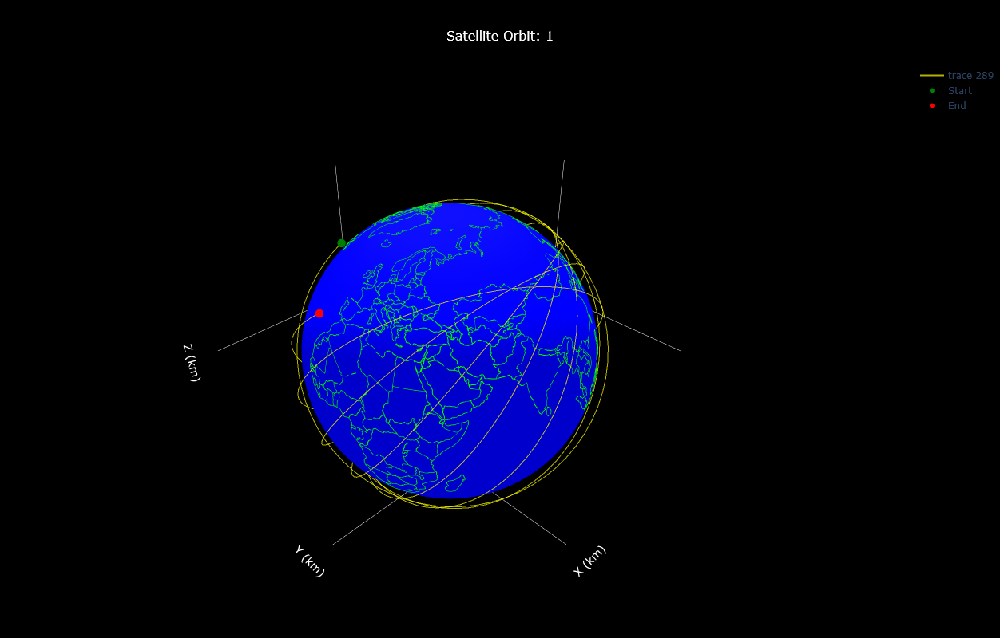

In [104]:
# Simple Test Case
if __name__ == '__main__':
    # Define Earth
    earth = CelestialBody(name='Earth', radius=6371, mu=398600)
    
    # Define ISS orbit based on the TLE
    num_planes = 1
    sats_per_plane = 1
    altitude_km = 420  # Approximate, based on typical ISS altitude
    inclination_deg = 51.6387  # From TLE
    raan_deg = 134.2889  # From TLE
    eccentricity = 0.0005831  # From TLE
    arg_perigee_deg = 315.8203  # From TLE
    mean_anomaly_deg = 179.6729  # From TLE
    mean_motion = 15.49515680  # From TLE
    
    mass = 450000  # kg (approximate)
    cross_sectional_area = 2500  # m^2 (approximate)
    
    # Generate ISS orbit
    iss_constellation = Constellation(name='ISS', satellites=[])
    
    # Calculate the semi-major axis from mean motion (Kepler's Third Law)
    semi_major_axis_km = (earth.mu / ((mean_motion * 2 * np.pi / 86400) ** 2)) ** (1/3)
    print(f"Semi-Major Axis: {semi_major_axis_km} km")
    
    # Create a single satellite with the ISS orbital parameters
    iss_satellite = Satellite(
        id=1,
        a=semi_major_axis_km,  # Semi-major axis in km
        e=eccentricity,
        inclination_deg=inclination_deg,
        raan=np.radians(raan_deg),
        arg_perigee=np.radians(arg_perigee_deg),  # Argument of Perigee in radians
        mean_anomaly=np.radians(mean_anomaly_deg),  # Mean anomaly in radians
        celestial_body=earth,
        mass=mass,
        cross_sectional_area=cross_sectional_area
    )
    iss_constellation.satellites = [iss_satellite]
    
    #orbital_period = iss_satellite.calculate_orbital_period()
    #print(f"Orbital Period: {orbital_period} minutes")
    
    # Propagate the orbit for a short duration
    start_time = datetime.utcnow()  # Or any specific start time
    duration_hours = 2
    x, y, z, times = iss_satellite.propagate_orbit(start_time, duration_hours)

    # Perform Orbit Analysis
    orbit_analysis = OrbitAnalysis(celestial_body=earth)
    
    # Define a location (e.g., Myrtle Beach)
    nyc_lat, nyc_lon = 33.6922, -78.8815
    
    # Set the epoch time from the TLE
    epoch = datetime(2025, 2, 26, 16, 41, 33)  # February 26, 2025, 16:41:33 UTC
    
    # Calculate Revisit Time
    duration_hours = 2  # 3 days
    revisit_results = orbit_analysis.calculate_revisit_time(iss_constellation, nyc_lat, nyc_lon, duration_hours, min_elevation_deg=10)

    print("\nRevisit Time Analysis Results for ISS orbit over New York City:")
    print(f"Average Visibility Duration: {revisit_results['avg_visibility_duration']}")
    print(f"Average Revisit Time: {revisit_results['avg_revisit_time']}")
    print(f"Maximum Revisit Time: {revisit_results['max_revisit_time']}")
    print(f"Visibility Percentage: {revisit_results['visibility_percentage']}")

    # Perform coverage Analysis
    beam_width_deg = 45
    coverage_percentage = orbit_analysis.calculate_coverage(iss_constellation, beam_width_deg)

    print("\nCoverage Analysis Results:")
    print(f"Coverage Percentage: {coverage_percentage:.4f}%")

    # Plotting (Optional)
    plotting_utils = PlottingUtils(celestial_body=earth)
    plotting_utils.plot_single_orbit(iss_satellite, duration_hours=12)
    #plotting_utils.plot_all_orbits(iss_constellation, duration_hours=2)
    #plotting_utils.plot_single_satellite_with_footprint(iss_satellite, duration_hours=0.1, beam_width_deg=45)


Initial Orbital Parameters for Molniya Satellite:
Semi-major axis (a): 26600 km
Eccentricity (e): 0.74
Inclination: 63.4°
RAAN: 0.0°
Argument of Perigee: 270.0°
Mean Anomaly: 0.0°
Files in the zip archive: ['ne_110m_admin_0_countries.README.html', 'ne_110m_admin_0_countries.VERSION.txt', 'ne_110m_admin_0_countries.cpg', 'ne_110m_admin_0_countries.dbf', 'ne_110m_admin_0_countries.prj', 'ne_110m_admin_0_countries.shp', 'ne_110m_admin_0_countries.shx']
Shapefile loaded successfully.


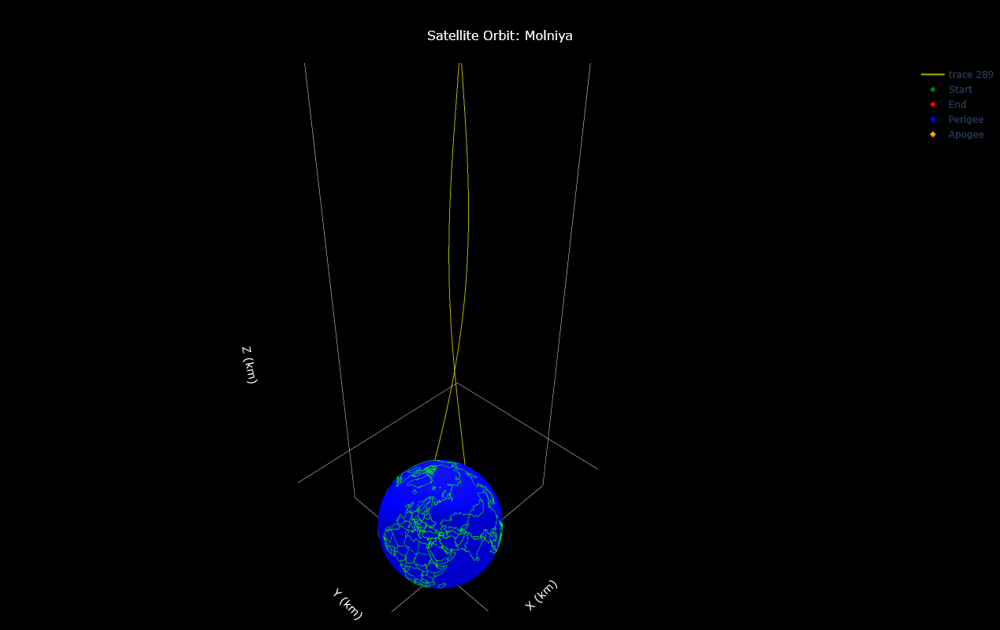

Number of points generated in propagation: 500
Files in the zip archive: ['ne_110m_admin_0_countries.README.html', 'ne_110m_admin_0_countries.VERSION.txt', 'ne_110m_admin_0_countries.cpg', 'ne_110m_admin_0_countries.dbf', 'ne_110m_admin_0_countries.prj', 'ne_110m_admin_0_countries.shp', 'ne_110m_admin_0_countries.shx']
Shapefile loaded successfully.


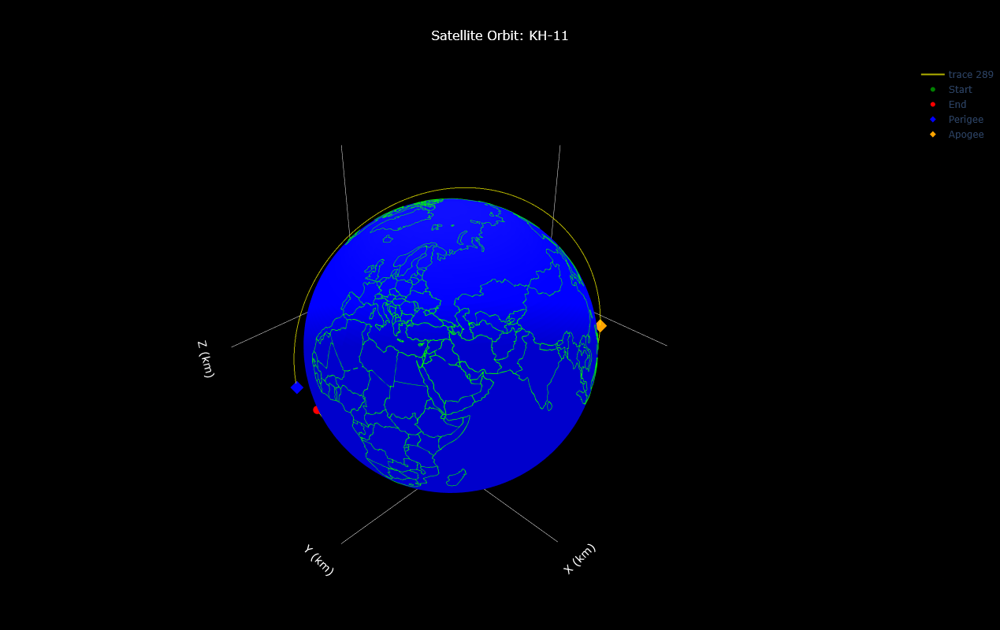

Number of points generated in propagation: 500


In [23]:
# Define Earth
earth = CelestialBody(name='Earth', radius=6371, mu=398600)

# Define a Molniya orbit
molniya_sat = Satellite(
    id=1,
    a=26600,  # Semi-major axis in km
    e=0.74,   # High eccentricity
    inclination_deg=63.4,  # Critical inclination to prevent argument of perigee drift
    raan=np.radians(0),  # RAAN in radians
    arg_perigee=np.radians(270),  # Argument of perigee at 270° (apogee over Northern Hemisphere)
    mean_anomaly=np.radians(0),  # Start at perigee
    celestial_body=earth,  # Assuming 'earth' is a predefined constant
    mass=1000,  # Mass in kg
    cross_sectional_area=2  # m² (arbitrary)
)

# Set start time and duration (12-hour orbit)
start_time = datetime.utcnow()
duration_hours = 12  # One full Molniya orbit

# Debugging step: Check initial orbital parameters
print(f"Initial Orbital Parameters for Molniya Satellite:")
print(f"Semi-major axis (a): {molniya_sat.a} km")
print(f"Eccentricity (e): {molniya_sat.e}")
print(f"Inclination: {molniya_sat.inclination_deg}°")
print(f"RAAN: {np.degrees(molniya_sat.raan)}°")
print(f"Argument of Perigee: {np.degrees(molniya_sat.arg_perigee)}°")
print(f"Mean Anomaly: {np.degrees(molniya_sat.mean_anomaly)}°")

# Propagate the orbit and get the perigee and apogee indices for the Molniya satellite
x_vals, y_vals, z_vals, perigee_idx, apogee_idx = molniya_sat.propagate_orbit(start_time, duration_hours, in_ecef=True)

# Create an instance of PlottingUtils
plotting_utils = PlottingUtils(celestial_body=earth)

# Plot the Molniya orbit using the plotting utility
plotting_utils.plot_orbit(x_vals, y_vals, z_vals, satellite_id="Molniya", perigee_idx=perigee_idx, apogee_idx=apogee_idx)

# Debugging step: Check the propagated position at each time step for the Molniya satellite
print(f"Number of points generated in propagation: {len(x_vals)}")

# Define a KH-11 satellite (Sun-synchronous orbit example)
kh11_sat = Satellite(
    id=2,
    a=7000,  # ~700 km altitude + Earth's radius (6378 km)
    e=0.01,  # Nearly circular
    inclination_deg=97.8,  # Sun-synchronous orbit
    raan=np.radians(120),  # Arbitrary RAAN
    arg_perigee=np.radians(0),  # Argument of perigee
    mean_anomaly=np.radians(0),  # Starting at perigee
    celestial_body=earth,  # Assuming 'earth' is a predefined constant
    mass=2000,  # Mass in kg
    cross_sectional_area=5  # Arbitrary cross-sectional area
)

# Propagate the orbit and get the perigee and apogee indices for the KH-11 satellite
x_vals, y_vals, z_vals, perigee_idx, apogee_idx = kh11_sat.propagate_orbit(start_time, duration_hours=1.5, in_ecef=True)

# Plot the KH-11 orbit using the plotting utility
plotting_utils.plot_orbit(x_vals, y_vals, z_vals, satellite_id="KH-11", perigee_idx=perigee_idx, apogee_idx=apogee_idx)

# Debugging step: Check the propagated position at each time step for the KH-11 satellite
print(f"Number of points generated in propagation: {len(x_vals)}")
